# Crop Yield Prediction
## Jordan Wheeler
## CSIS 44688

The goal of this project is to build and train a model to aid in predicting crop
yield based on a variety of factors, including environmental, soil, and pesticides,
to name a few. The information discovered could help reduce the area needed for
farming, which would help reduce waste and other environmental factors. This
could lead to a more sustainable farming economy

## Step 1: Import Libraries

In [58]:
import numpy as np
import pandas as pd
import os
from sklearn.preprocessing import LabelEncoder
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
import plotly.express as px
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPRegressor
from IPython.display import display

In [2]:
print(os.getcwd())

C:\Users\jorda\OneDrive\Desktop\Northwest Homework\1. Capstone\Github\capstone-crop-yield


### Import Datasets

In [3]:
data_pesticides = pd.read_csv('Data/pesticides.csv')
data_precipitation = pd.read_csv('Data/rainfall.csv')
data_temperature = pd.read_csv('Data/temp.csv')
data_yield = pd.read_csv('Data/yield.csv')


## Step 2: Explore Data

In [4]:
data_yield.head()

,Domain Code,Domain,Area Code,Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value
0,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1961,1961,hg/ha,14000
1,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1962,1962,hg/ha,14000
2,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1963,1963,hg/ha,14260
3,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1964,1964,hg/ha,14257
4,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1965,1965,hg/ha,14400


In [5]:
data_yield.tail()

,Domain Code,Domain,Area Code,Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value
56712,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2012,2012,hg/ha,24420
56713,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2013,2013,hg/ha,22888
56714,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2014,2014,hg/ha,21357
56715,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2015,2015,hg/ha,19826
56716,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2016,2016,hg/ha,18294


In [6]:
fields_needed = ['Area', 'Item', 'Year', 'Value']
data_yield = data_yield[fields_needed]

data_yield.head()

,Area,Item,Year,Value
0,Afghanistan,Maize,1961,14000
1,Afghanistan,Maize,1962,14000
2,Afghanistan,Maize,1963,14260
3,Afghanistan,Maize,1964,14257
4,Afghanistan,Maize,1965,14400


After creating the fields needed function, that function was
then appended to the data field function to keep the information that we needed.
It was then checked for accuracy using the  ̇head or  ̇tail suffix. For the yield, the
only fields kept were ’Area’, ’Item’, ’Year’, and ’Ve'.ith


In [7]:
data_temperature.head()

,year,country,avg_temp
0,1849,Côte D'Ivoire,25.58
1,1850,Côte D'Ivoire,25.52
2,1851,Côte D'Ivoire,25.67
3,1852,Côte D'Ivoire,NaN
4,1853,Côte D'Ivoire,NaN


In [8]:
data_temperature.rename(columns = {'year' : 'Year', 'country' : 'Area'}, inplace = True)
data_temperature.head()

,Year,Area,avg_temp
0,1849,Côte D'Ivoire,25.58
1,1850,Côte D'Ivoire,25.52
2,1851,Côte D'Ivoire,25.67
3,1852,Côte D'Ivoire,NaN
4,1853,Côte D'Ivoire,NaN


When examining the temperature data, at first the information looked good.
It was decided that all fields were needed however, there was a problem with
Crop Yield and Area Managemency. The original data had ’year’ and ’country’ as labeled columns.
However, ’Year’ and ’Area’ are used in the yield data. In order to join the data,
it was needed to use the  ̇rename function to ensure that the column headers
were consistent. As seen below, the columns were renamed to align with the
yield data.

In [9]:
data_precipitation.head()

,Area,Year,average_rain_fall_mm_per_year
0,Afghanistan,1985,327
1,Afghanistan,1986,327
2,Afghanistan,1987,327
3,Afghanistan,1989,327
4,Afghanistan,1990,327


The precipitation file contained only the columns that we needed. We were
provided with the ’Area’, ’Year’, and ’average rain fall mm per year’. While the
last column header is not exactly how it wanted, it was decided to adjust the
column header during the merge sequence of the project.


In [10]:
data_pesticides.head()

,Domain,Area,Element,Item,Year,Unit,Value
0,Pesticides Use,Albania,Use,Pesticides (total),1990,tonnes of active ingredients,121.0
1,Pesticides Use,Albania,Use,Pesticides (total),1991,tonnes of active ingredients,121.0
2,Pesticides Use,Albania,Use,Pesticides (total),1992,tonnes of active ingredients,121.0
3,Pesticides Use,Albania,Use,Pesticides (total),1993,tonnes of active ingredients,121.0
4,Pesticides Use,Albania,Use,Pesticides (total),1994,tonnes of active ingredients,201.0


In [11]:
fields_needed = ['Area', 'Year', 'Value']
data_pesticides = data_pesticides[fields_needed]

data_pesticides.head()

,Area,Year,Value
0,Albania,1990,121.0
1,Albania,1991,121.0
2,Albania,1992,121.0
3,Albania,1993,121.0
4,Albania,1994,201.0


The last field to check was the pesticide information. Pesticides are notorious
for helping protect crops against invasive species which leads to a higher yield.
When pulling the pesticide information, the following information was available,
’Domain’, ’Area’, ’Element’, ’Item’, ’Year’, ’Unit’, and ’Value’. Again, the only
information needed was ’Area’, ’Year’, and ’Value’. The domain was all the same,
the element column was only about its use, the item was known to be a pesticide
and the unit was the same for all. Due to these occurrences, the columns were
eliminated.

### Examine The Cleaned Data

In [12]:
print('Pesticides :', data_pesticides.shape)
print('Precipitation :', data_precipitation.shape)
print('Temperature :', data_temperature.shape)
print('Yield :', data_yield.shape)

Pesticides : (4349, 3)
Precipitation : (6727, 3)
Temperature : (71311, 3)
Yield : (56717, 4)


In [13]:
data_temperature = data_temperature[data_temperature.Year >= 1961]
yield_merge = pd.merge(data_yield, data_temperature, on =['Year', 'Area'])
yield_merge = pd.merge(yield_merge, data_pesticides, on = ['Year', 'Area'])
yield_merge.rename(columns = {'Value_x': 'Yield', 'Value_y': 'Pesticides'}, inplace = True)
data_precipitation.rename(columns = {' Area': 'Area',}, inplace = True)
yield_merge = pd.merge(yield_merge, data_precipitation, on = ['Year', 'Area'])
yield_merge.rename(columns = {'average_rain_fall_mm_per_year':'avg_precipitation'}, inplace = True)
yield_merge.head()
df_yield = yield_merge

df_yield.head()

,Area,Item,Year,Yield,avg_temp,Pesticides,avg_precipitation
0,Albania,Maize,1990,36613,16.37,121.0,1485
1,Albania,Potatoes,1990,66667,16.37,121.0,1485
2,Albania,"Rice, paddy",1990,23333,16.37,121.0,1485
3,Albania,Sorghum,1990,12500,16.37,121.0,1485
4,Albania,Soybeans,1990,7000,16.37,121.0,1485


In [14]:
# Specify the folder path
folder_path = 'Data'

# Ensure the "Data" folder exists; create it if it doesn't
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Create the full file path
file_name = 'df_yield.csv'
full_file_path = os.path.join(folder_path, file_name)

# Save the DataFrame to the specified file
df_yield.to_csv(full_file_path, index=False)

print(f"DataFrame 'df_yield' saved to '{full_file_path}'")

DataFrame 'df_yield' saved to 'Data\df_yield.csv'


In [15]:
df_yield.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28248 entries, 0 to 28247
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Area               28248 non-null  object 
 1   Item               28248 non-null  object 
 2   Year               28248 non-null  int64  
 3   Yield              28248 non-null  int64  
 4   avg_temp           28248 non-null  float64
 5   Pesticides         28248 non-null  float64
 6   avg_precipitation  28248 non-null  object 
dtypes: float64(2), int64(2), object(3)
memory usage: 1.5+ MB


In [16]:
df_yield.shape

(28248, 7)

## Exploratory Data Analysis

In [17]:
# Examine Numerical Statistics

df_yield.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,28248.0,2001.541950,7.052997,1990.00,1995.00,2001.00,2008.00,2013.00
Yield,28248.0,77047.863282,84950.194454,50.00,19918.75,38295.00,104598.25,501412.00
avg_temp,28248.0,20.543722,6.311828,1.30,16.71,21.51,26.00,30.65
Pesticides,28248.0,37069.136973,59954.787836,0.04,1695.71,17517.76,48687.88,367778.00


From the table we see that the average yield is 77047, average temperature was 20.5, and average pesticide use was 37069.

In [18]:
# Examine Categorical Data

df_yield.describe(include = 'object')

,Area,Item,avg_precipitation
count,28248,28248,28248
unique,101,10,101
top,India,Potatoes,1083
freq,4048,4276,4048


Here we can see that we have the same amount of records as our numerical data. India was the top country in Area, whereas potatoes are the top crop

array([[<Axes: title={'center': 'Year'}>,
        <Axes: title={'center': 'Yield'}>],
       [<Axes: title={'center': 'avg_temp'}>,
        <Axes: title={'center': 'Pesticides'}>]], dtype=object)

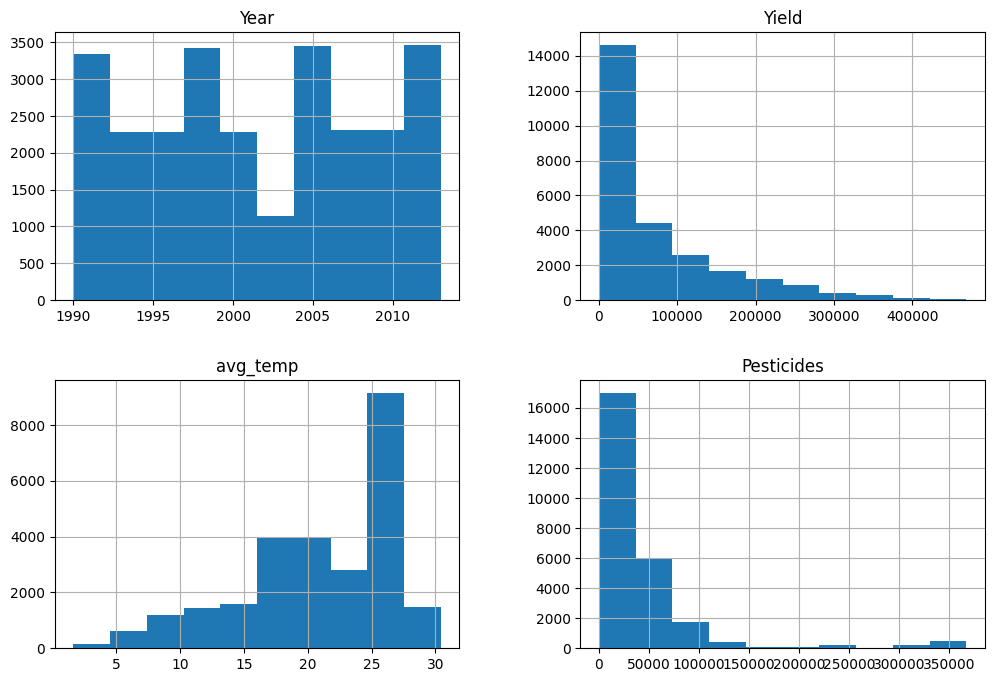

In [25]:
df_yield.hist(figsize=(12,8))

For our data to be presented more accurately, any country that does not produce at least 100 records is going to be dropped. This will help eliminate some outlier information and prevent skewed data.

In [21]:
# Remove Countries

country_records =df_yield['Area'].value_counts()
drop_countries = country_records[country_records < 100].index.tolist()
df_filtered = df_yield[~df_yield['Area'].isin(drop_countries)]
df_yield = df_filtered.reset_index(drop=True)

In [22]:
df_yield.shape

(26297, 7)

<Axes: >

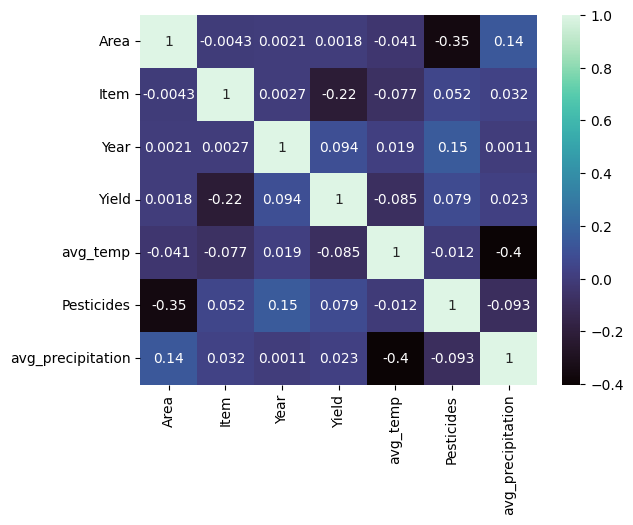

In [20]:
# Create a copy of our data for visualizations

df_yield_copy = df_yield.copy()

# Data Cleaning

category_fields = df_yield_copy.select_dtypes(include=['object']).columns.tolist()
label_encoder = LabelEncoder()
for column in category_fields:
    df_yield_copy[column] = label_encoder.fit_transform(df_yield_copy[column])


# View Correlation Matrix

sns.heatmap(df_yield_copy.corr() , annot= True , cmap='mako')

The data obtained from this visual showed a few weak correlations. When looking at area, we can see that there is a weak negative correlation between Pesticides used and Average Precipitation. We also see a weak negative correlation between Item and Yield. We have a weak positive correlation between Average Temperature and Average Precipitation. 

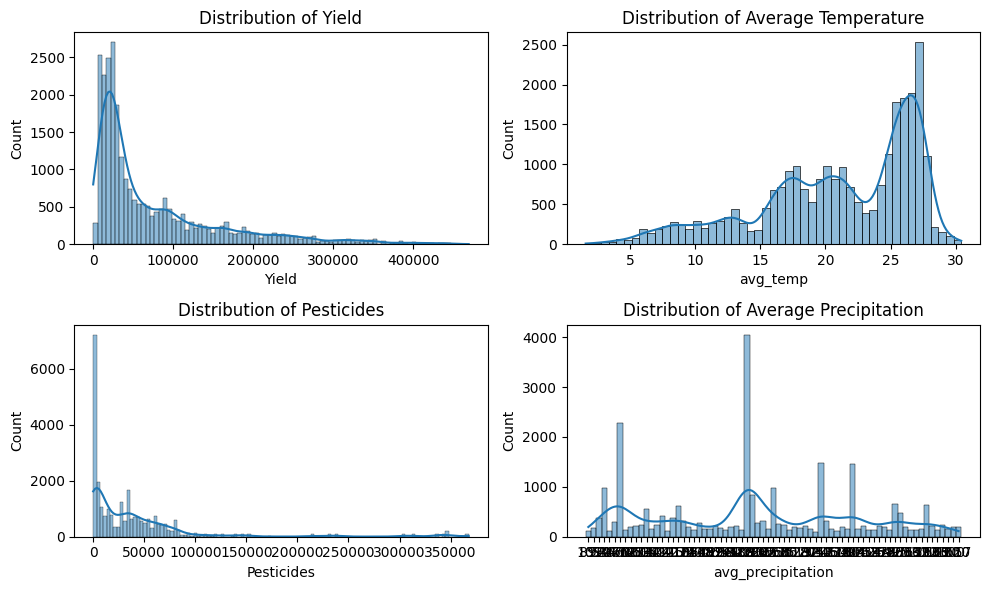

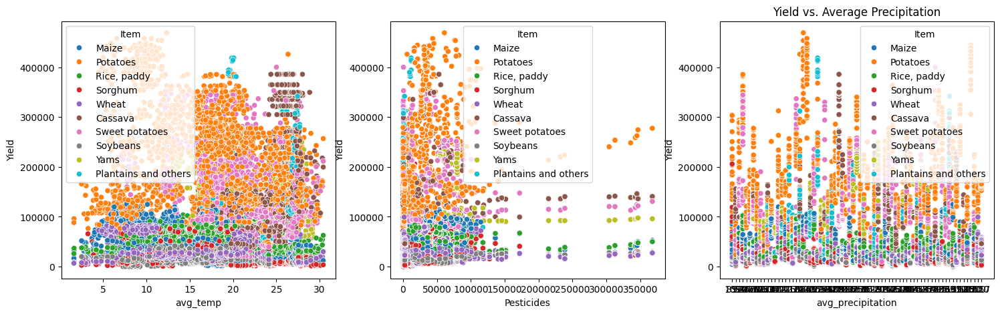

In [21]:
# Set Color Palette
sns.color_palette("rocket")

# Distribution plots
fig, axes = plt.subplots(2, 2, figsize=(10, 6))
sns.histplot(df_yield['Yield'], ax=axes[0, 0], kde=True).set_title('Distribution of Yield')
sns.histplot(df_yield['avg_temp'], ax=axes[0, 1], kde=True).set_title('Distribution of Average Temperature')
sns.histplot(df_yield['Pesticides'], ax=axes[1, 0], kde=True).set_title('Distribution of Pesticides')
sns.histplot(df_yield['avg_precipitation'], ax=axes[1, 1], kde=True).set_title('Distribution of Average Precipitation')
plt.tight_layout()
plt.show()

# Scatter plot of 'Yield' vs. 'avg_temp', 'Pesticides', 'avg_precipitation'
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
sns.scatterplot(x='avg_temp', y='Yield', data=df_yield, hue='Item', ax=axes[0])
plt.title('Yield vs. Average Temperature')
sns.scatterplot(x='Pesticides', y='Yield', data=df_yield, hue='Item', ax=axes[1])
plt.title('Yield vs. Average Pesticides')
sns.scatterplot(x='avg_precipitation', y='Yield', data=df_yield, hue='Item', ax=axes[2])
plt.title('Yield vs. Average Precipitation')
plt.show()

From the images we have obtained, we can see that for our average yield, we have a right tail indicating that high yields are less common than average yields. The average temperature seems to have a fairly normal skew while precipitation values tend to be on the lower end.

Looking at the scatter plots, we see variability between all of our crops and yields. Average temperature shows that some crops have a wider variability such as wheat and rice whereas cassava and sweet potatoes are more clustered. This indicates that temperature ranges are variable depending on the crop but no significant linear relationship exists. Pesticide usuage shows that most of our yield comes from lower pesticide usage. Finally, with precipitation we still do not have a distinct linear relationship. It is noted that on precipitation, we have a larger cluster towarsd the bottom. This can indicate that crops have a threshold of precipitation when it comes to determining the yield.

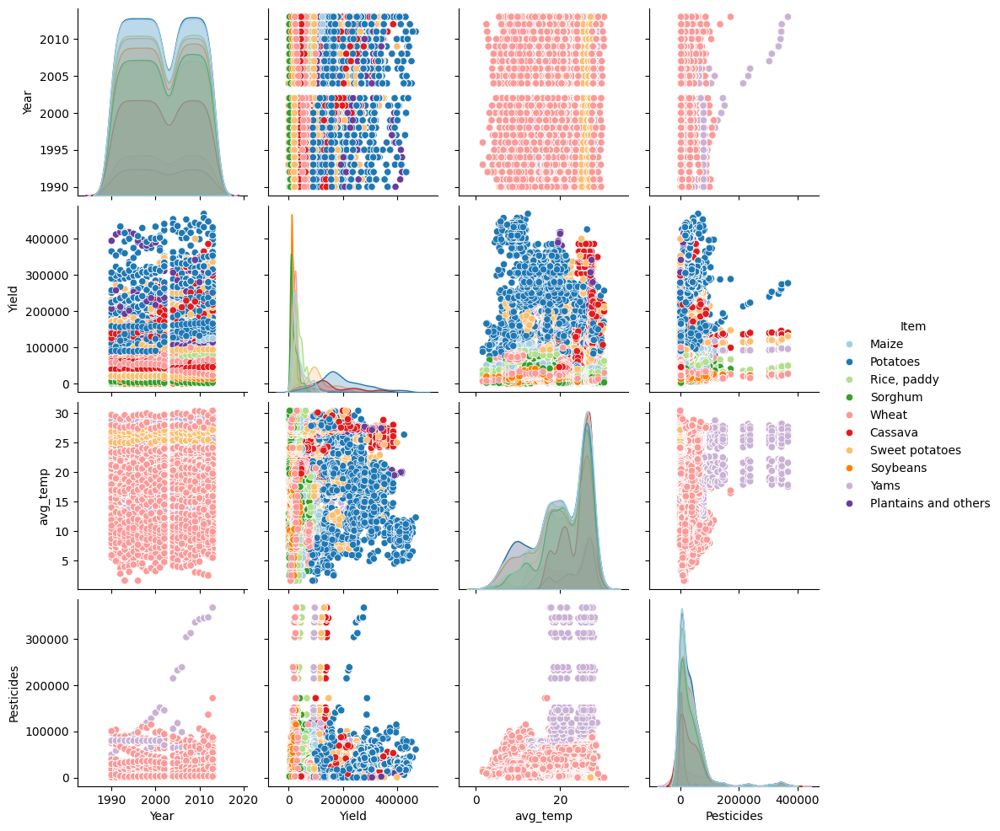

In [22]:
sns.pairplot(data=df_yield,hue='Item',kind='scatter',palette='Paired')

The first group of charts shows the year, yield, and average temperature with crop distribution overlaid. We can see that the values are bimodal indicating different peaks in the various crops. When observing, Year vs Yield, we can see a more concentrated level of data in the late 2000's meaning that we crop yields are either getting better or we have more data. Due to there being a non discernible upward or downward trend, the inference is that we have more data. Average temperature seems to be remaining near the same across the years whereas pesticide usage has increased. 
When comparing yield to environmental factors, we again do not see a strong correlation between temperatures and crop yield. As shown in the correlation matrix, high pesticide usage does not show a clear indication of higher yield. One interesting point is when looking at the variance in soybeans and sweet potatoes suggesting they are more susceptible to environmental factors

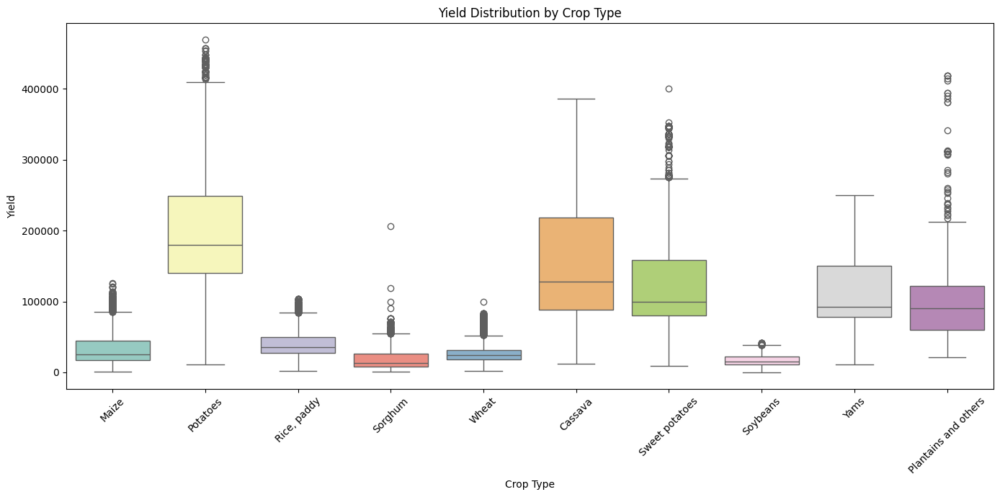

In [34]:
plt.figure(figsize=(14, 7))
sns.boxplot(x='Item', y='Yield', data=df_yield, hue='Item', dodge=False, palette="Set3", legend=False)

# Improve the aesthetics
plt.xticks(rotation=45)  # Rotate the x labels for better readability
plt.title('Yield Distribution by Crop Type')
plt.xlabel('Crop Type')
plt.ylabel('Yield')

# Show the plot
plt.tight_layout()
plt.show()

### Yield By Countries

In [23]:
# Ensure 'Yield' is a numerical data type
df_yield['Yield'] = pd.to_numeric(df_yield['Yield'], errors='coerce')

# Drop NaN values that may have resulted from conversion
df_yield.dropna(subset=['Yield'], inplace=True)

# Use qcut to split 'Area' into 6 quantiles
df_yield['group'] = pd.cut(df_yield['Area'].astype('category').cat.codes, bins=6, labels=False)

# Group by the new 'group' column and 'Area', then sum 'Yield'
grouped_yield = df_yield.groupby(['group', 'Area'])['Yield'].sum().reset_index()

# Sort the results by 'group' and 'Yield' to compare total yields
sorted_grouped_yield = grouped_yield.sort_values(by=['group', 'Yield'], ascending=[True, False])

# Print the sorted grouped yield
print(sorted_grouped_yield)

    group        Area      Yield
6       0      Brazil  167550306
3       0   Australia  109111062
11      0      Canada   34706922
2       0   Argentina   32864032
5       0  Bangladesh   15440318
..    ...         ...        ...
65      5      Uganda    7494314
70      5    Zimbabwe    7408629
69      5      Zambia    7254311
62      5  Tajikistan    6295210
66      5     Ukraine    5496901

[71 rows x 3 columns]


After splitting into groups, we can visualize the yield and precipitation for the Area's for each group.

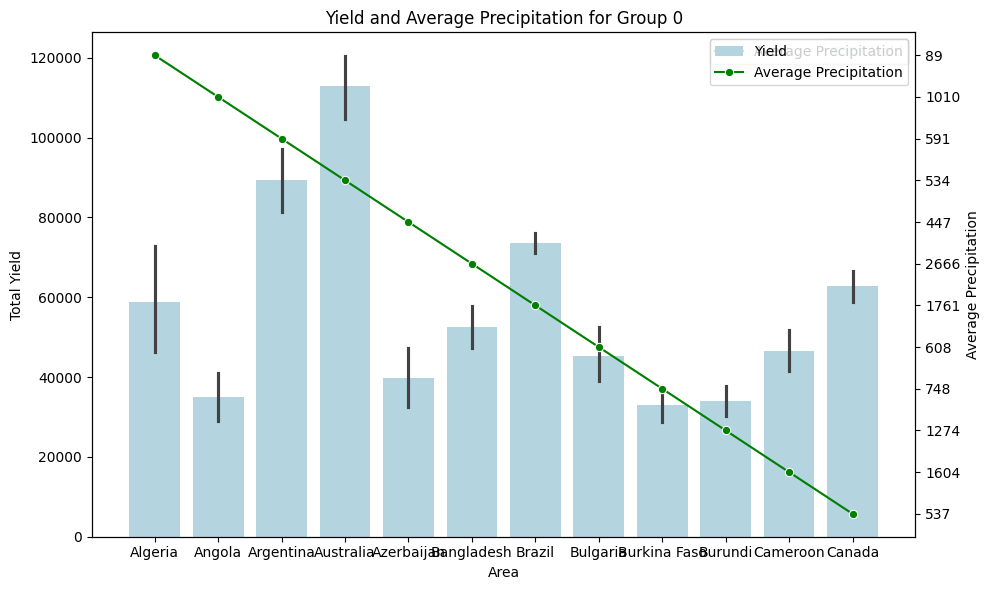

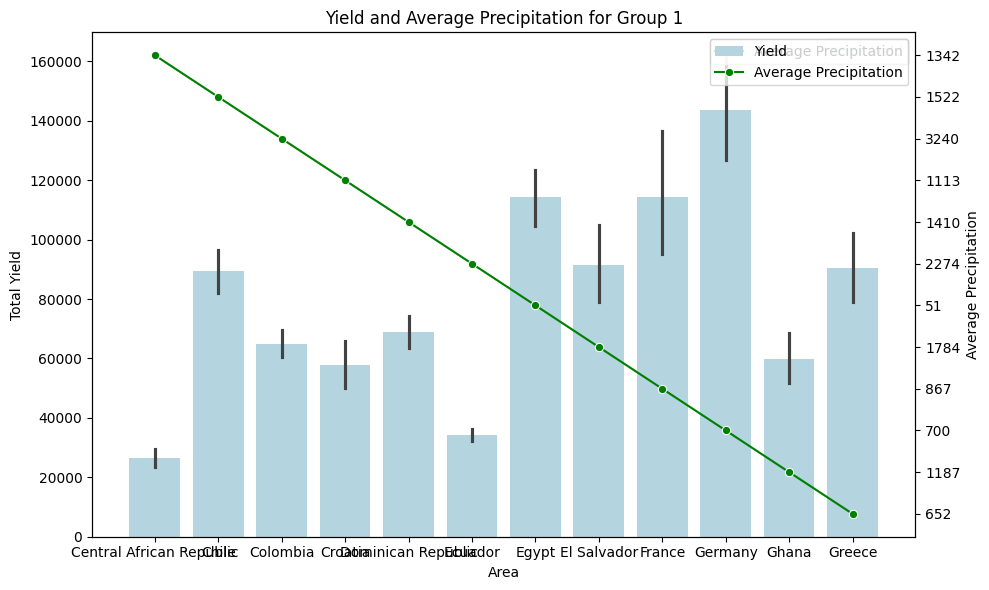

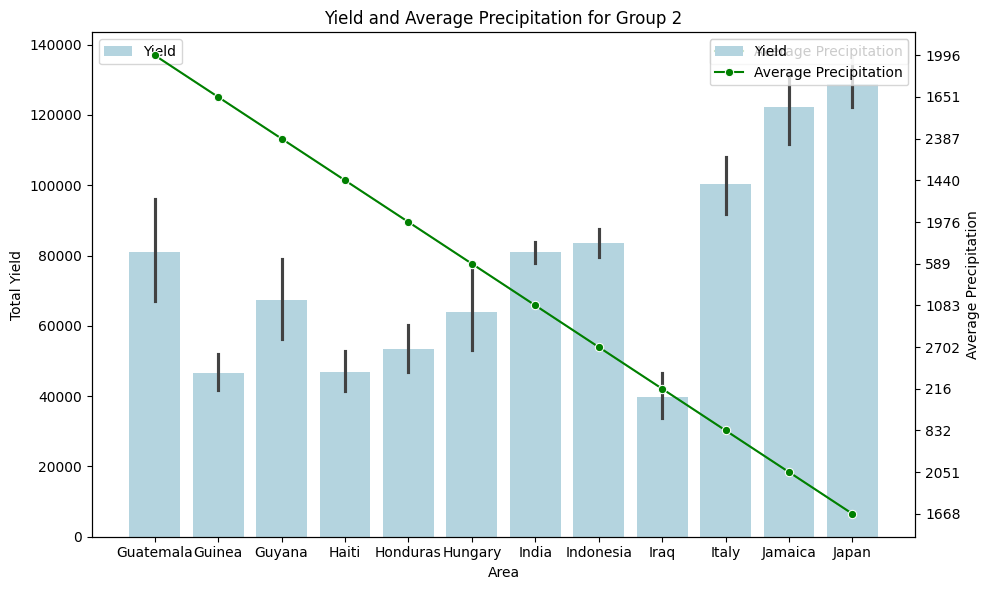

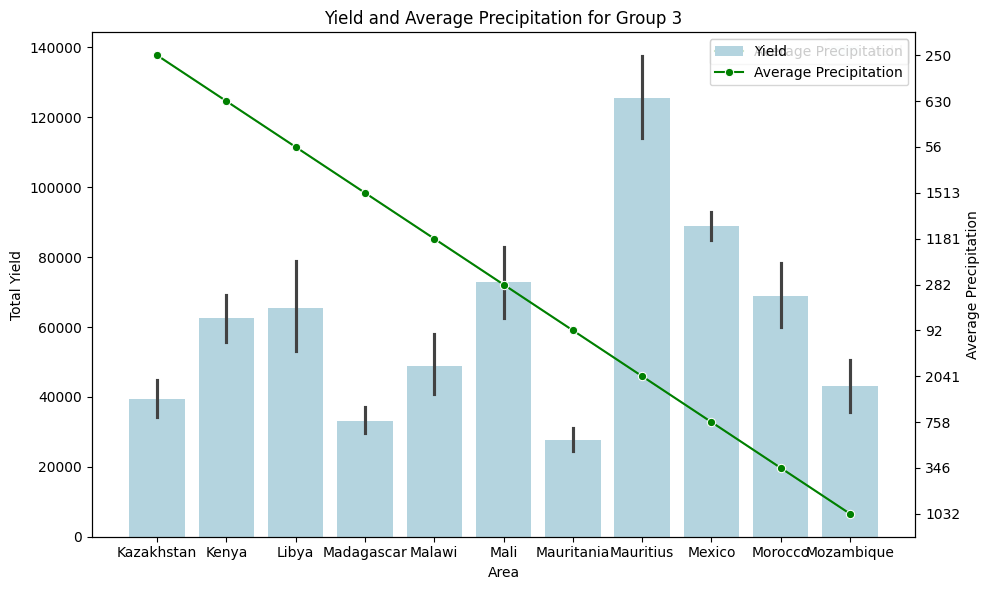

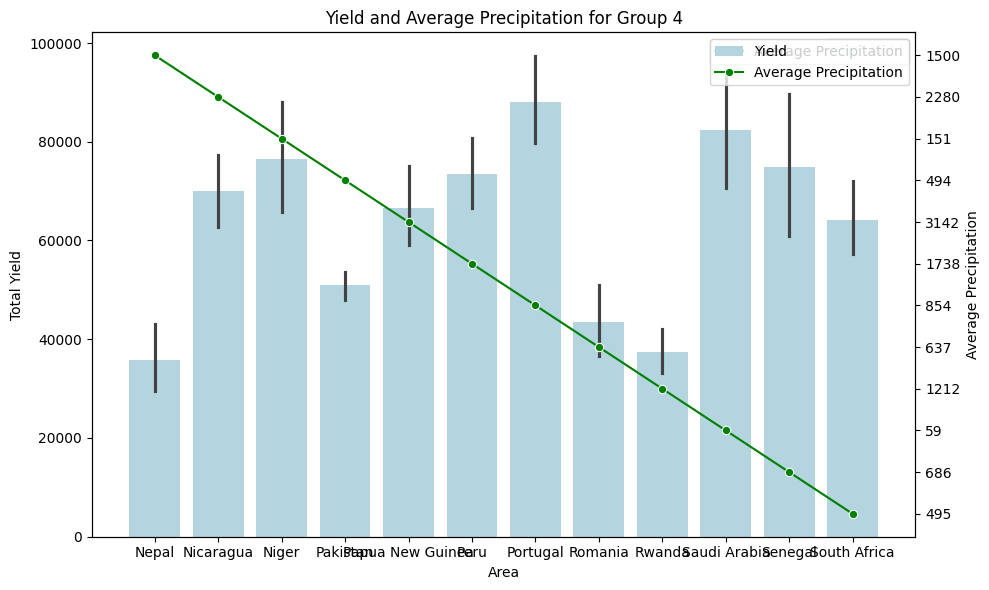

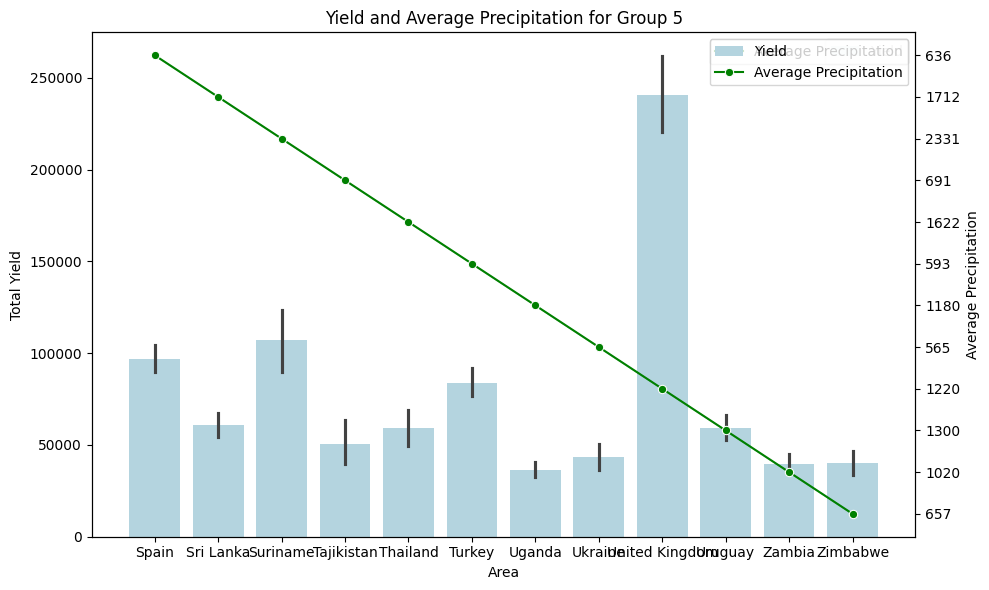

In [24]:
# Loop through each group and create separate Yield and Precipitation plots
for group in df_yield['group'].unique():
    group_data = df_yield[df_yield['group'] == group]
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Bar plot for Yield in the group
    sns.barplot(x='Area', y='Yield', data=group_data, ax=ax1, color='lightblue', label='Yield')
    
    # Create a second y-axis for the average precipitation
    ax2 = ax1.twinx()
    
    # Line plot for average precipitation in the group
    sns.lineplot(x='Area', y='avg_precipitation', data=group_data, ax=ax2, color='green', marker='o', label='Average Precipitation')
    
    # Final plot adjustments
    ax1.set_title(f'Yield and Average Precipitation for Group {group}')
    ax1.set_ylabel('Total Yield')
    ax2.set_ylabel('Average Precipitation')
    ax1.set_xlabel('Area')
    fig.legend(loc='upper right', bbox_to_anchor=(1, 1), bbox_transform=ax1.transAxes)

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


From our graphs it is noted that larger precipitation does not equate to a higher yield. However, now we want to see if more pesticide use means more yield.

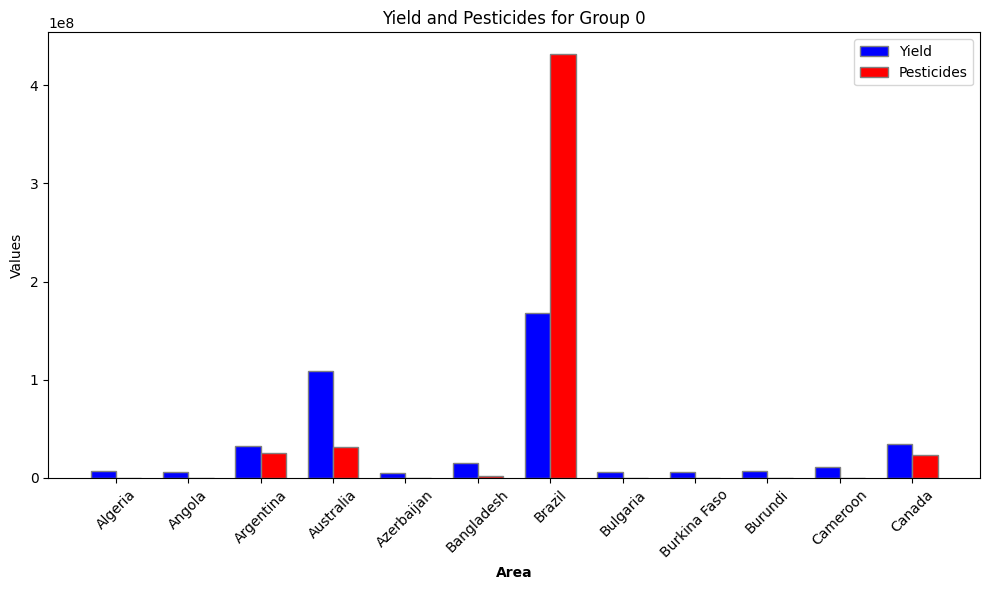

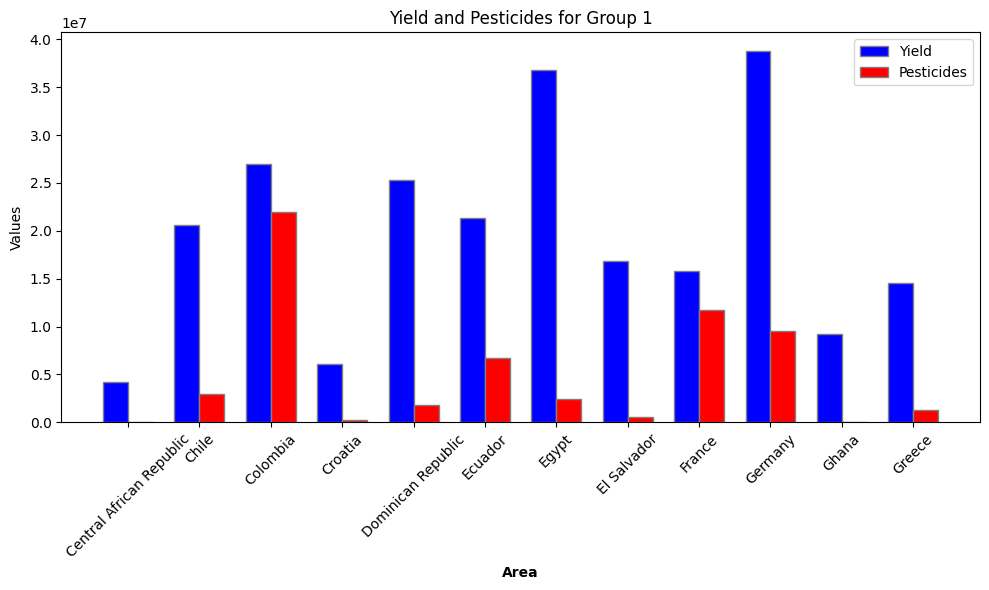

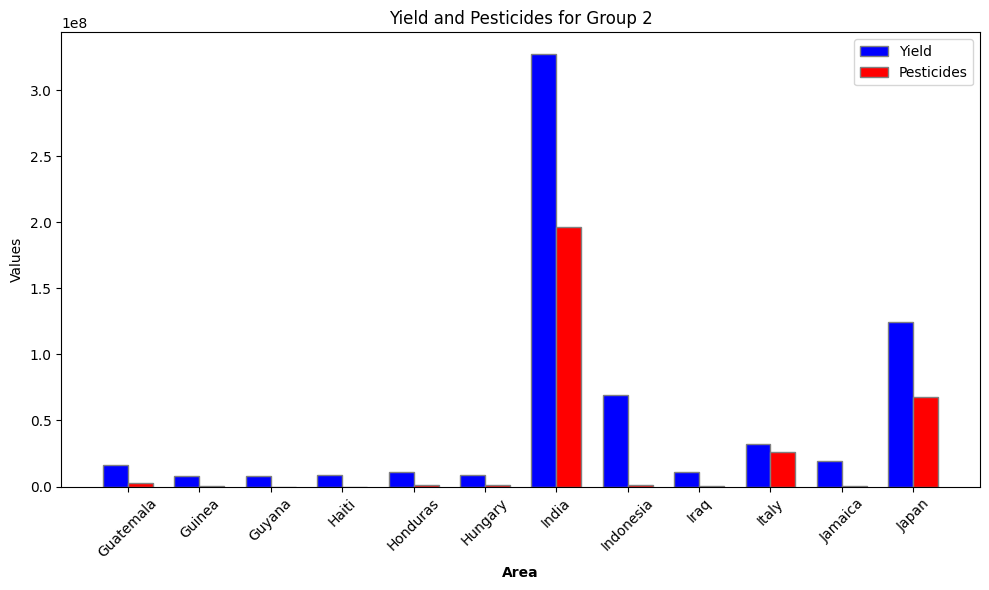

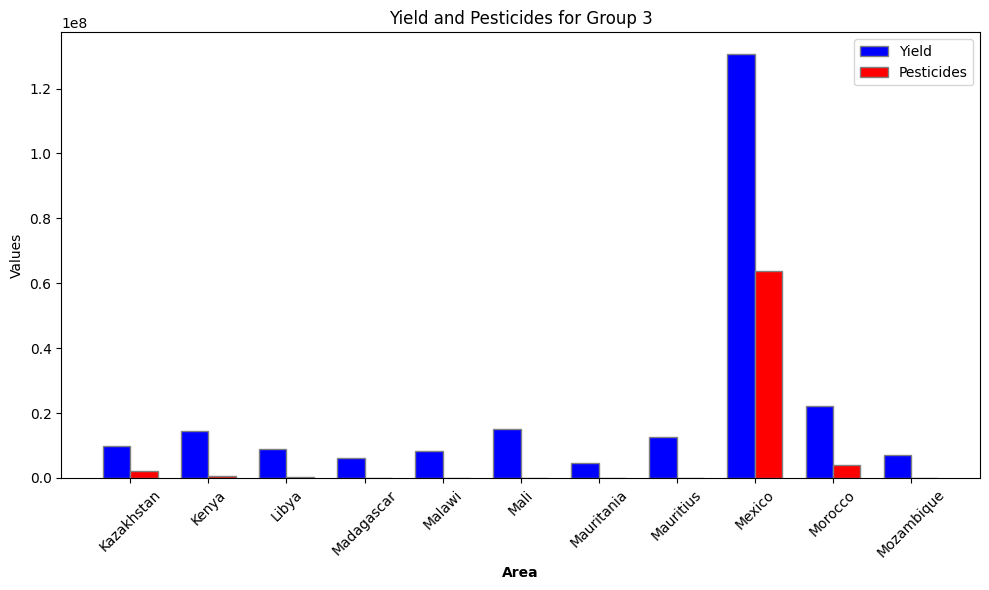

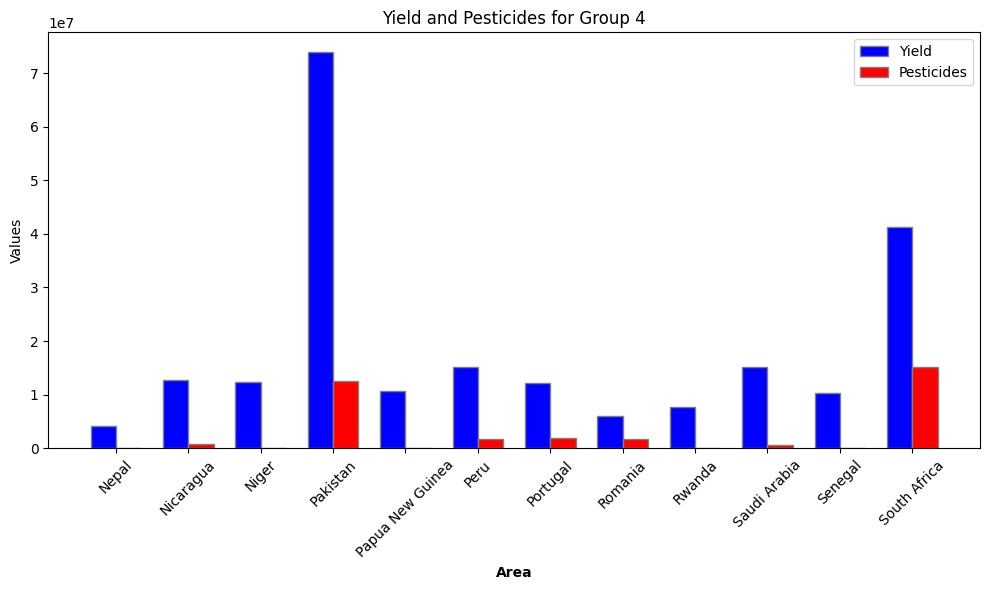

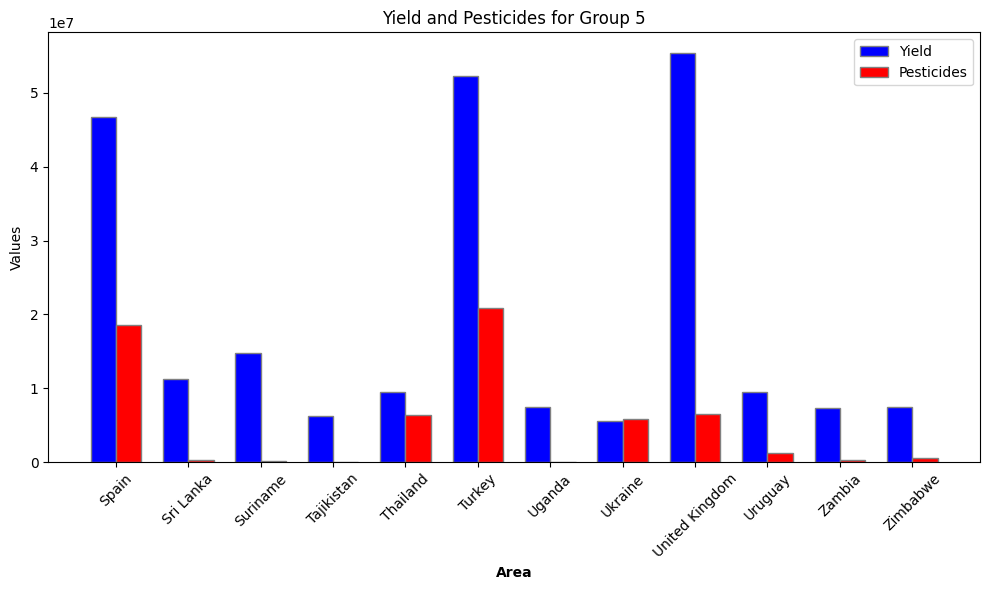

In [25]:
# Define the bar width for the clustered bar chart
bar_width = 0.35

# Loop through each group and create separate clustered bar charts for Yield and Pesticides
for group in sorted(df_yield['group'].unique()):
    group_data = df_yield[df_yield['group'] == group]
    fig, ax = plt.subplots(figsize=(10, 6))

    # Set the positions of the bars on the x-axis
    areas = group_data['Area'].unique()
    r1 = range(len(areas))
    r2 = [x + bar_width for x in r1]

    # Calculate sum of Yield and Pesticides for each area within the group
    yield_sums = group_data.groupby('Area')['Yield'].sum()
    pesticide_sums = group_data.groupby('Area')['Pesticides'].sum()

    # Make the plots
    plt.bar(r1, yield_sums, color='blue', width=bar_width, edgecolor='grey', label='Yield')
    plt.bar(r2, pesticide_sums, color='red', width=bar_width, edgecolor='grey', label='Pesticides')

    # Add labels, title, and legend
    plt.xlabel('Area', fontweight='bold')
    plt.ylabel('Values')
    plt.title(f'Yield and Pesticides for Group {group}')
    plt.xticks([r + bar_width / 2 for r in range(len(r1))], areas, rotation=45)
    plt.legend()

    plt.tight_layout()
    plt.show()


It seems that more pesticide use does not always mean a higher yield. To be sure of this, we want to see the yield of crops based on pesticide usage.

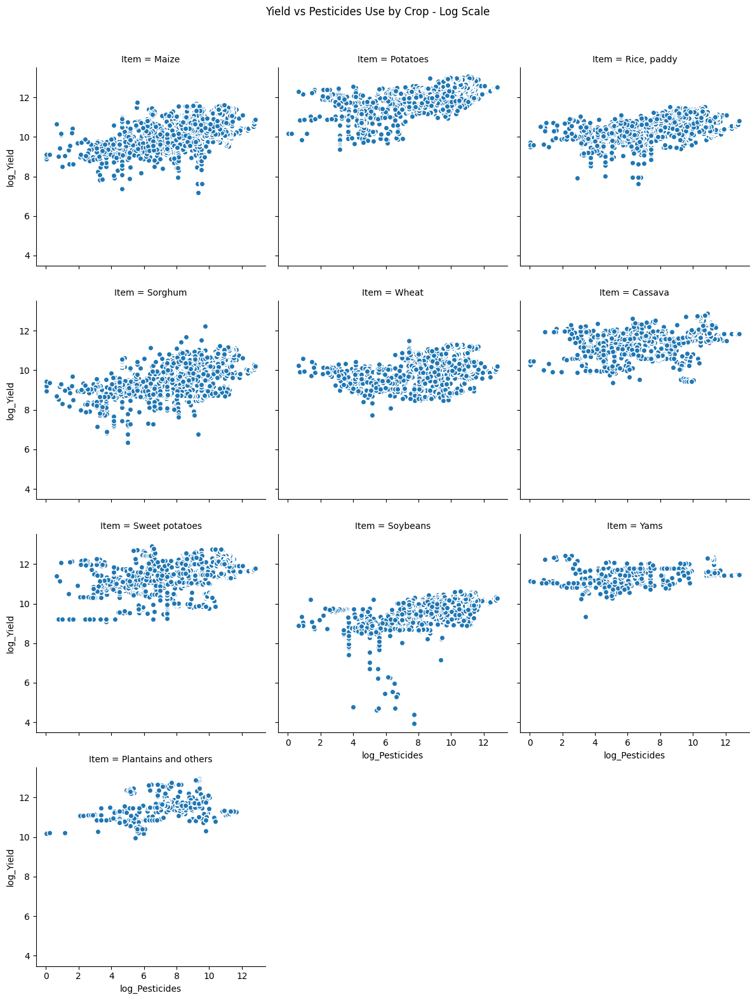

In [47]:
# Convert to logarithmic scale for better visibility
df_yield['log_Yield'] = np.log1p(df_yield['Yield'])
df_yield['log_Pesticides'] = np.log1p(df_yield['Pesticides'])

# FacetGrid to create a grid of scatter plots
g = sns.FacetGrid(df_yield, col='Item', col_wrap=3, height=4)
g = g.map(plt.scatter, 'log_Pesticides', 'log_Yield', edgecolor="w")

# Add a main title
plt.subplots_adjust(top=0.92)
g.fig.suptitle('Yield vs Pesticides Use by Crop - Log Scale')

# Show the plot
plt.show()

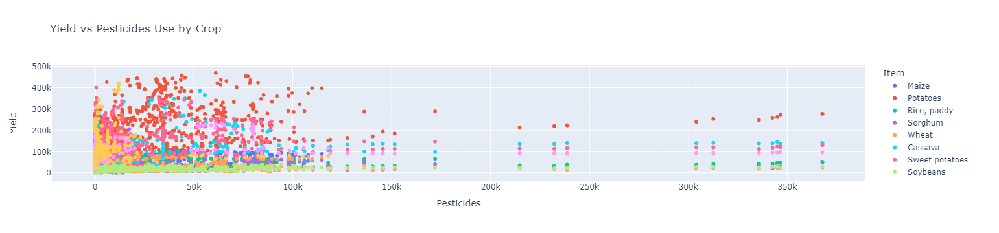

In [27]:
# Create an interactive scatter plot
fig = px.scatter(df_yield, x='Pesticides', y='Yield', color='Item',
                 hover_data=['Item'], title='Yield vs Pesticides Use by Crop')

# Show the plot
fig.show()

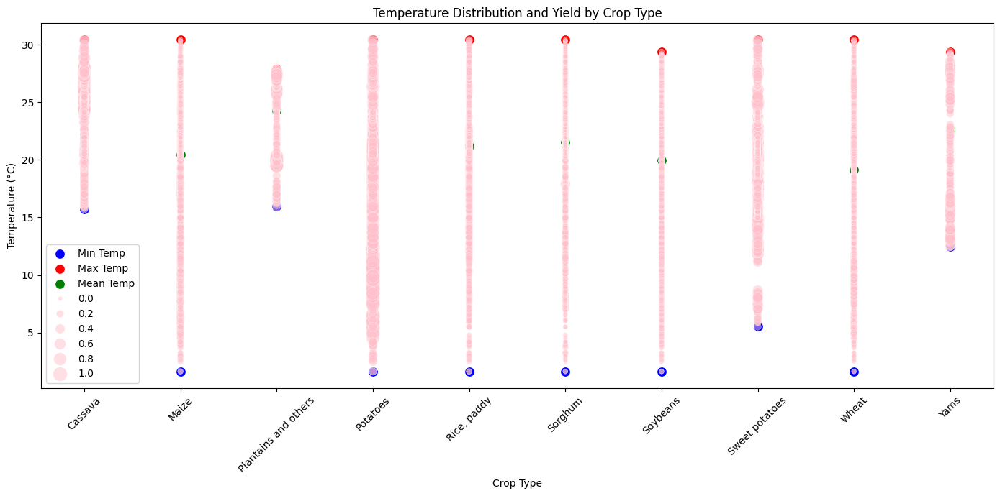

In [27]:
# Calculate the minimum, maximum, and average temperatures for each crop
temp_stats = df_yield.groupby('Item')['avg_temp'].agg(['min', 'mean', 'max']).reset_index()

# Normalize the yield data to use for point sizes
df_yield['yield_normalized'] = (df_yield['Yield'] - df_yield['Yield'].min()) / (df_yield['Yield'].max() - df_yield['Yield'].min())

# Initialize the matplotlib figure
plt.figure(figsize=(14, 7))

# Plot the min and max temperatures
sns.scatterplot(data=temp_stats, x='Item', y='min', color='blue', label='Min Temp', s=100)
sns.scatterplot(data=temp_stats, x='Item', y='max', color='red', label='Max Temp', s=100)

# Plot the mean temperatures
sns.scatterplot(data=temp_stats, x='Item', y='mean', color='green', label='Mean Temp', s=100)

# Plot all the individual temperature observations to show distribution
# Size represents normalized yield
sns.scatterplot(x='Item', y='avg_temp', size='yield_normalized', sizes=(20, 200), data=df_yield, color='Pink', alpha=0.5)

# Improve the aesthetics
plt.xticks(rotation=45)
plt.title('Temperature Distribution and Yield by Crop Type')
plt.xlabel('Crop Type')
plt.ylabel('Temperature (°C)')

# Place the legend
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

## Modeling

### Linear Regression Model

In [106]:
# Define the features and target variable
features = ['avg_temp', 'Pesticides', 'avg_precipitation', 'Item']
X = df_yield[features]
y = df_yield['Yield']

# Create a column transformer to apply OneHotEncoder to the 'Item' column
preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(), ['Item'])
    ],
    remainder='passthrough'
)

# Create a pipeline with the preprocessor and the LinearRegression model
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', LinearRegression())
])

# Fit the pipeline to the data
pipeline.fit(X, y)

# Get the feature names after one-hot encoding
ohe = preprocessor.named_transformers_['onehot']
feature_names = ohe.get_feature_names_out(input_features=['Item'])
other_features = ['avg_temp', 'Pesticides', 'avg_precipitation']
all_features = list(feature_names) + other_features

# Get the coefficients for the features from the model
coefficients = pipeline.named_steps['model'].coef_

# Print out the features with their coefficients
feature_coefficients = dict(zip(all_features, coefficients))
for feature, coef in feature_coefficients.items():
    print(f'{feature}: {coef}')

# Print out the intercept
intercept = pipeline.named_steps['model'].intercept_
print(f'Intercept: {intercept}')

Item_Cassava: 73695.96877135707
Item_Maize: -50868.50836569491
Item_Plantains and others: 36334.20764525579
Item_Potatoes: 109284.63410717006
Item_Rice, paddy: -42678.07767291202
Item_Sorghum: -64885.536291960125
Item_Soybeans: -70272.39711771201
Item_Sweet potatoes: 37325.4622253015
Item_Wheat: -60791.03147959604
Item_Yams: 32855.27817878186
avg_temp: -1801.5550594006304
Pesticides: 0.11601221545424778
avg_precipitation: -6.987677816854557
Intercept: 125627.79637737753


### 

In [64]:
# Define the features and target variable
categorical_features = ['Item']
numerical_features = ['avg_temp', 'Pesticides', 'avg_precipitation']
features = numerical_features + categorical_features
X = df_yield[features]
y = df_yield['Yield']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a column transformer to apply OneHotEncoder to the 'Item' column
preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(), categorical_features)
    ],
    remainder='passthrough'
)

# Define polynomial features with interaction only
poly_features = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)

# Create a pipeline with the preprocessor, polynomial features, and a linear regression model
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('polynomial_features', poly_features),
    ('linear_regression', LinearRegression())
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Predict and evaluate on training data
y_train_pred = pipeline.predict(X_train)
r2_train = r2_score(y_train, y_train_pred)
mse_train = mean_squared_error(y_train, y_train_pred)

# Predict and evaluate on testing data
y_test_pred = pipeline.predict(X_test)
r2_test = r2_score(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)

# Print the results for training data
print(f'Training Data - R-squared: {r2_train}, Mean Squared Error: {mse_train}')

# Print the results for testing data
print(f'Testing Data - R-squared: {r2_test}, Mean Squared Error: {mse_test}')

Training Data - R-squared: 0.7054187453180795, Mean Squared Error: 2027516959.4368858
Testing Data - R-squared: 0.6978514392847912, Mean Squared Error: 2020360951.030442


## Preparing Data/Splitting Data for Models

In [73]:
# Encoding Categorical Features
categorical_features = ['Item', 'Area']
numerical_features = ['Pesticides', 'avg_temp', 'avg_precipitation']

preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(), categorical_features)
    ],
    remainder='passthrough'
)

X = df_yield[categorical_features + numerical_features]
y = df_yield['Yield']

# Splitting data
X_transformed = preprocessor.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.2, random_state=42)

### Random Forest

In [75]:
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Predictions
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

# R-squared
rf_train_score = r2_score(y_train, y_train_pred)
rf_test_score = r2_score(y_test, y_test_pred)

# Mean Absolute Error (MAE)
rf_train_mae = mean_absolute_error(y_train, y_train_pred)
rf_test_mae = mean_absolute_error(y_test, y_test_pred)

# Mean Squared Error (MSE)
rf_train_mse = mean_squared_error(y_train, y_train_pred)
rf_test_mse = mean_squared_error(y_test, y_test_pred)

# Root Mean Squared Error (RMSE)
rf_train_rmse = np.sqrt(rf_train_mse)
rf_test_rmse = np.sqrt(rf_test_mse)

# Printing the results
print(f"Random Forest - Training R-squared: {rf_train_score}, Testing R-squared: {rf_test_score}")
print(f"Random Forest - Training MAE: {rf_train_mae}, Testing MAE: {rf_test_mae}")
print(f"Random Forest - Training MSE: {rf_train_mse}, Testing MSE: {rf_test_mse}")
print(f"Random Forest - Training RMSE: {rf_train_rmse}, Testing RMSE: {rf_test_rmse}")

Random Forest - Training R-squared: 0.9965158673142643, Testing R-squared: 0.9781383253668104
Random Forest - Training MAE: 1871.8146608726593, Testing MAE: 4618.192191729352
Random Forest - Training MSE: 23980270.288701937, Testing MSE: 146181314.41195276
Random Forest - Training RMSE: 4896.965416326925, Testing RMSE: 12090.546489383876


### Gradient Boost

In [76]:
gb = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
gb.fit(X_train, y_train)

# Predictions
y_train_pred = gb.predict(X_train)
y_test_pred = gb.predict(X_test)

# R-squared
gb_train_score = r2_score(y_train, y_train_pred)
gb_test_score = r2_score(y_test, y_test_pred)

# Mean Absolute Error (MAE)
gb_train_mae = mean_absolute_error(y_train, y_train_pred)
gb_test_mae = mean_absolute_error(y_test, y_test_pred)

# Mean Squared Error (MSE)
gb_train_mse = mean_squared_error(y_train, y_train_pred)
gb_test_mse = mean_squared_error(y_test, y_test_pred)

# Root Mean Squared Error (RMSE)
gb_train_rmse = np.sqrt(gb_train_mse)
gb_test_rmse = np.sqrt(gb_test_mse)

# Printing the results
print(f"Gradient Boosting - Training R-squared: {gb_train_score}, Testing R-squared: {gb_test_score}")
print(f"Gradient Boosting - Training MAE: {gb_train_mae}, Testing MAE: {gb_test_mae}")
print(f"Gradient Boosting - Training MSE: {gb_train_mse}, Testing MSE: {gb_test_mse}")
print(f"Gradient Boosting - Training RMSE: {gb_train_rmse}, Testing RMSE: {gb_test_rmse}")

Gradient Boosting - Training R-squared: 0.8786733540770624, Testing R-squared: 0.8695895131711178
Gradient Boosting - Training MAE: 18823.41311759759, Testing MAE: 19008.43458442212
Gradient Boosting - Training MSE: 835055959.3683732, Testing MSE: 872008969.9261676
Gradient Boosting - Training RMSE: 28897.334814276095, Testing RMSE: 29529.798000090817


### Decision Tree

In [77]:
dt = DecisionTreeRegressor(random_state=42)
dt.fit(X_train, y_train)

# Predictions
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

# R-squared
dt_train_score = r2_score(y_train, y_train_pred)
dt_test_score = r2_score(y_test, y_test_pred)

# Mean Absolute Error (MAE)
dt_train_mae = mean_absolute_error(y_train, y_train_pred)
dt_test_mae = mean_absolute_error(y_test, y_test_pred)

# Mean Squared Error (MSE)
dt_train_mse = mean_squared_error(y_train, y_train_pred)
dt_test_mse = mean_squared_error(y_test, y_test_pred)

# Root Mean Squared Error (RMSE)
dt_train_rmse = np.sqrt(dt_train_mse)
dt_test_rmse = np.sqrt(dt_test_mse)

# Printing the results
print(f"Decision Tree - Training R-squared: {dt_train_score}, Testing R-squared: {dt_test_score}")
print(f"Decision Tree - Training MAE: {dt_train_mae}, Testing MAE: {dt_test_mae}")
print(f"Decision Tree - Training MSE: {dt_train_mse}, Testing MSE: {dt_test_mse}")
print(f"Decision Tree - Training RMSE: {dt_train_rmse}, Testing RMSE: {dt_test_rmse}")

Decision Tree - Training R-squared: 0.9996235157810199, Testing R-squared: 0.9695195003143801
Decision Tree - Training MAE: 143.6630856744466, Testing MAE: 4684.50576679341
Decision Tree - Training MSE: 2591231.202971748, Testing MSE: 203812360.34007183
Decision Tree - Training RMSE: 1609.7301646461583, Testing RMSE: 14276.28664394463


### K-Nearest Neighbors

In [78]:
knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(X_train, y_train)

# Predictions
y_train_pred = knn.predict(X_train)
y_test_pred = knn.predict(X_test)

# R-squared
knn_train_score = r2_score(y_train, y_train_pred)
knn_test_score = r2_score(y_test, y_test_pred)

# Mean Absolute Error (MAE)
knn_train_mae = mean_absolute_error(y_train, y_train_pred)
knn_test_mae = mean_absolute_error(y_test, y_test_pred)

# Mean Squared Error (MSE)
knn_train_mse = mean_squared_error(y_train, y_train_pred)
knn_test_mse = mean_squared_error(y_test, y_test_pred)

# Root Mean Squared Error (RMSE)
knn_train_rmse = np.sqrt(knn_train_mse)
knn_test_rmse = np.sqrt(knn_test_mse)

# Printing the results
print(f"K-Nearest Neighbors - Training R-squared: {knn_train_score}, Testing R-squared: {knn_test_score}")
print(f"K-Nearest Neighbors - Training MAE: {knn_train_mae}, Testing MAE: {knn_test_mae}")
print(f"K-Nearest Neighbors - Training MSE: {knn_train_mse}, Testing MSE: {knn_test_mse}")
print(f"K-Nearest Neighbors - Training RMSE: {knn_train_rmse}, Testing RMSE: {knn_test_rmse}")

K-Nearest Neighbors - Training R-squared: 0.6550086712730538, Testing R-squared: 0.435578349890539
K-Nearest Neighbors - Training MAE: 29984.503427294767, Testing MAE: 38704.01764258555
K-Nearest Neighbors - Training MSE: 2374474813.775305, Testing MSE: 3774088677.0999694
K-Nearest Neighbors - Training RMSE: 48728.58312915844, Testing RMSE: 61433.61194899718


### Determine Optimal Hyperparamters

In [44]:
def perform_grid_search(estimator, param_grid):
    grid_search = GridSearchCV(estimator=estimator, param_grid=param_grid, cv=5, scoring='r2', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    print(f"Best Parameters: {best_params}")
    print(f"Best R-squared: {best_score}")

# Random Forest Grid Search
rf_params = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10]
}
perform_grid_search(RandomForestRegressor(random_state=42), rf_params)

# Gradient Boosting Grid Search
gb_params = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 10]
}
perform_grid_search(GradientBoostingRegressor(random_state=42), gb_params)

# Decision Tree Grid Search
dt_params = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
perform_grid_search(DecisionTreeRegressor(random_state=42), dt_params)

# K-Nearest Neighbors Grid Search
knn_params = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}
perform_grid_search(KNeighborsRegressor(), knn_params)

Best Parameters: {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 300}
Best R-squared: 0.9762657344980283
Best Parameters: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 300}
Best R-squared: 0.9771812496630998
Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 10}
Best R-squared: 0.9694251030960549
Best Parameters: {'algorithm': 'auto', 'n_neighbors': 5, 'weights': 'distance'}
Best R-squared: 0.5089728090326358


### Neural Network

In [79]:
# Buidling the Model
nn_model = MLPRegressor(hidden_layer_sizes=(100,), max_iter=500, random_state=42)

# Training the model
nn_model.fit(X_train, y_train)

# Predicting and evaluating the model
y_train_pred = nn_model.predict(X_train)
y_test_pred = nn_model.predict(X_test)

# R-squared
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

# Mean Absolute Error (MAE)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)

# Mean Squared Error (MSE)
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

# Root Mean Squared Error (RMSE)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)

# Printing the results
print(f"Neural Network - Training R-squared: {train_r2}, Testing R-squared: {test_r2}")
print(f"Neural Network - Training MAE: {train_mae}, Testing MAE: {test_mae}")
print(f"Neural Network - Training MSE: {train_mse}, Testing MSE: {test_mse}")
print(f"Neural Network - Training RMSE: {train_rmse}, Testing RMSE: {test_rmse}")

Neural Network - Training R-squared: 0.5527243156113428, Testing R-squared: 0.5543506490479962
Neural Network - Training MAE: 36729.2937528, Testing MAE: 36274.159197393914
Neural Network - Training MSE: 3078468236.619264, Testing MSE: 2979900166.9385376
Neural Network - Training RMSE: 55483.94575568021, Testing RMSE: 54588.461848073144


C:\Users\jorda\OneDrive\Desktop\Northwest Homework\1. Capstone\Github\capstone-crop-yield\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


### Models Performance

|Model |Set  |MAE |RMSE |MSE |R^2 |
|---|---|---:|---:|---:|---|
|Random Forest|Training| 1871.81| 4896.96| 23980270.28| 0.996 |
|              | Test    |4618.19|12090.54|146181314.41|0.978 | 
|Gradient Boosting| Training| 18823.41 | 28897.33 | 835055959.36 | 0.878 |
| | Test | 19008.43 | 29529.79 | 872008969.92 |0.869 |
| Decision Tree | Training | 143.66 | 1609.73 | 2591231.20 | 0.999 |
| | Test | 4684.50 | 14276.28 | 203812360.34 | 0.969 |
| K_Nearest | Training | 29984.50 | 48728.58 | 2374474813.77 | 0.655|
| | Test | 38704.01 | 61433.61 | 3774088677.09 | 0.435 |
| Neural Network | Training | 36729.29 | 55483.94 | 3078468236.61 | 0.552 |
| | Test | 36274.15 | 54588.46 | 2979900166.93 | 0.554 |

### Multicollinearity Analysis

In [54]:
# Handle missing values first
df_yield = df_yield.dropna()

# Selecting only the numeric independent variables for multicollinearity check
numeric_features = ['avg_temp', 'Pesticides', 'avg_precipitation']
X = df_yield[numeric_features]

# Convert all columns of DataFrame to floats, if they are not already
X = X.astype(float)

# Add a constant term for the intercept
X = add_constant(X)

# Ensure there are no infinite values in the data
X.replace([np.inf, -np.inf], np.nan, inplace=True)
X.dropna(inplace=True)

# Calculate VIFs for each variable
vif_data = pd.DataFrame()
vif_data['feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)

             feature        VIF
0              const  13.932124
1           avg_temp   1.119957
2         Pesticides   1.034677
3  avg_precipitation   1.152840
